In [1]:
from helpers import *

In [1]:
# We save scaled down weight to keep the lambda value in a reasonable magnitude
#scale down the weight by approx 512*512
!./bart/bart scale 0.002  ./bart_data/weights_bart ./bart_data/weights_bart_scaled

In [3]:
# Example usage (assuming groundtruth is already defined):
groundtruth = cfl.readcfl(f'./bart_data/finalphantomimage')
image = abs(groundtruth)

# Call the function to select the ROI
ellipse_params = select_roi(image)

# After the user clicks "Validate", the ellipse_params will be returned
print(f"Selected Ellipse Parameters: {ellipse_params}")

Selected Ellipse Parameters: {}


In [4]:
ellipse_params

{'center_x': 256,
 'center_y': 260,
 'major_axis': 175,
 'minor_axis': 229,
 'angle': 0}

In [ ]:
# This is just an example, to be consistent we will use the same ellipse params as in the MATLAB CODE:
#switch prefix
#    case 'phantom'
#        image = shepp_logan_phantom;
#        ellipse = [258, 254, 176, 235, 0]; 
#    case 'brain'
#        image = finalbrainimage;
#        ellipse = [271, 250, 202, 220, 0];
#    case 'cardiac'
#        image = cardiacimage;
#        ellipse = [250, 234, 107, 95, 75];
#    case 'cardiac2'
#        image = cardiacimage2;
#        ellipse = [262, 217, 100, 132, 145];
#    otherwise
#        error('Invalid prefix provided.');
#end
# These are stored within the evaluate_bart_reconstruction_with_roi function

In [2]:
# The ground truth images are stored in the bart_data with all the data necessary for the reconstruction process. 
prefix = 'phantom'
recontype = 'l2'
regvals = np.logspace(-3, 4, 30)

In [3]:
!./bart/bart pics -Rh

Generalized regularization options (experimental)

-R <T>:A:B:C	<T> is regularization type (single letter),
		A is transform flags, B is joint threshold flags,
		and C is regularization value. Specify any number
		of regularization terms.

-R Q:C    	l2-norm in image domain
-R I:B:C  	l1-norm in image domain
-R W:A:B:C	l1-wavelet
-R N:A:B:C	Normalized Iterative Hard Thresholding (NIHT), image domain
		C is an integer percentage, i.e. from 0-100
-R H:A:B:C	NIHT, wavelet domain
-R F:A:B:C	l1-Fourier
-R T:A:B:C	total variation
-R T:7:0:.01	3D isotropic total variation with 0.01 regularization.
-R G:A:B:C	total generalized variation
-R C:A:B:C	infimal convolution TV
-R L:7:7:.02	Locally low rank with spatial decimation and 0.02 regularization.
-R M:7:7:.03	Multi-scale low rank with spatial decimation and 0.03 regularization.
-R TF:{graph_path}:lambda	TensorFlow loss


[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001000
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.672093
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001743
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.816990
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.003039
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.975415
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.005298
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time

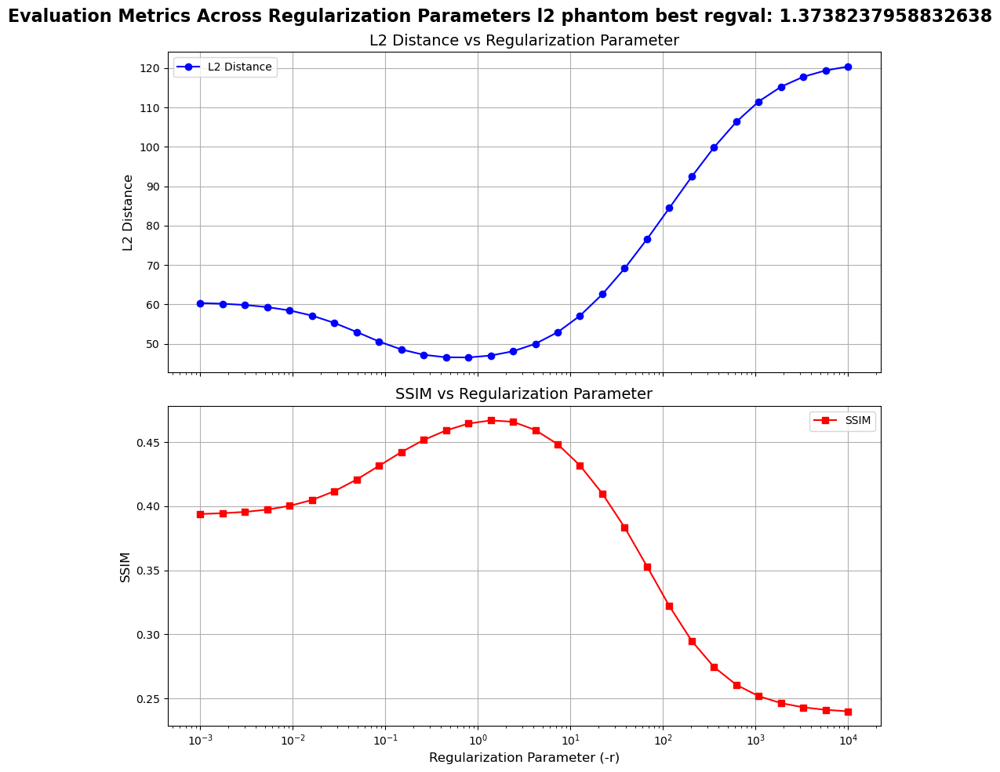

 the best regularization value seems to be: 1.3738237958832638


{'roi_parameters': {'center_x': 258,
  'center_y': 254,
  'major_axis': 176,
  'minor_axis': 235,
  'angle': 0},
 'regularization_values': [0.001,
  0.0017433288221999873,
  0.0030391953823131978,
  0.005298316906283708,
  0.009236708571873866,
  0.01610262027560939,
  0.02807216203941177,
  0.04893900918477494,
  0.0853167852417281,
  0.14873521072935117,
  0.2592943797404667,
  0.45203536563602453,
  0.7880462815669912,
  1.3738237958832638,
  2.395026619987486,
  4.175318936560405,
  7.278953843983154,
  12.689610031679234,
  22.122162910704503,
  38.56620421163472,
  67.23357536499334,
  117.21022975334817,
  204.33597178569437,
  356.2247890262444,
  621.0169418915616,
  1082.636733874054,
  1887.3918221350996,
  3290.344562312671,
  5736.152510448682,
  10000.0],
 'l2_distances': [60.35979080200195,
  60.168670654296875,
  59.86299133300781,
  59.326377868652344,
  58.467098236083984,
  57.17098617553711,
  55.31211853027344,
  53.01106643676758,
  50.60026550292969,
  48.5610885

In [6]:
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l2",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.001000
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 98.827817
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.001743
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 94.060882
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.003039
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 94.067581
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.005298
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 97.218213
[  1 512  30  30   1   1   1   1   1   1   1   1

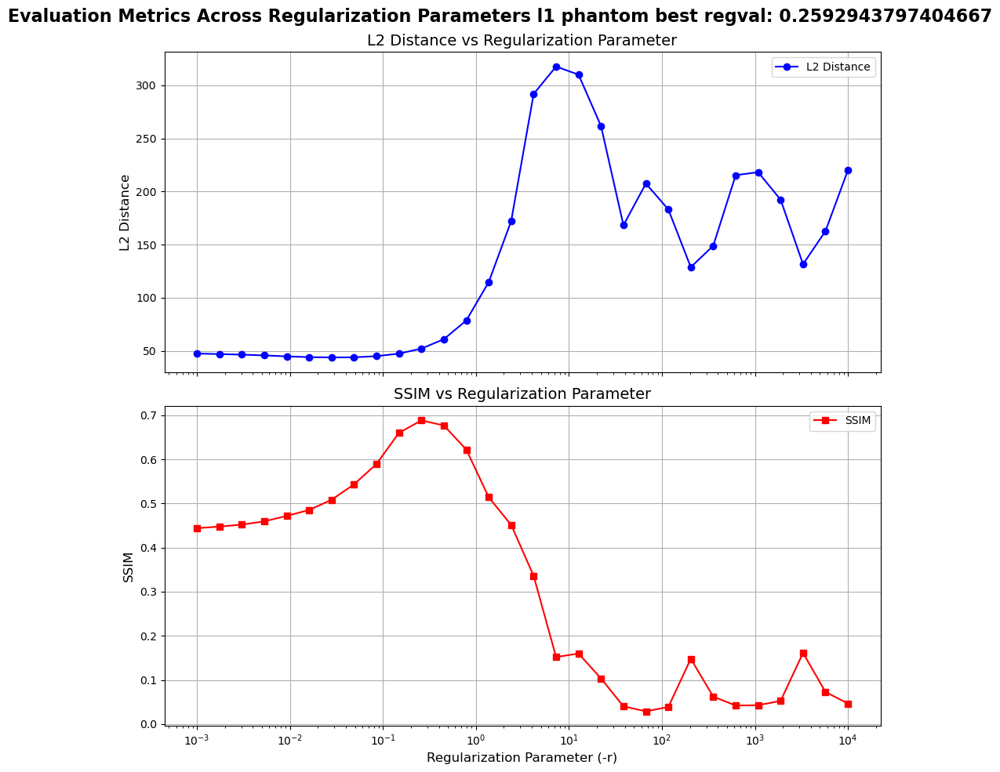

 the best regularization value seems to be: 0.2592943797404667


{'roi_parameters': {'center_x': 258,
  'center_y': 254,
  'major_axis': 176,
  'minor_axis': 235,
  'angle': 0},
 'regularization_values': [0.001,
  0.0017433288221999873,
  0.0030391953823131978,
  0.005298316906283708,
  0.009236708571873866,
  0.01610262027560939,
  0.02807216203941177,
  0.04893900918477494,
  0.0853167852417281,
  0.14873521072935117,
  0.2592943797404667,
  0.45203536563602453,
  0.7880462815669912,
  1.3738237958832638,
  2.395026619987486,
  4.175318936560405,
  7.278953843983154,
  12.689610031679234,
  22.122162910704503,
  38.56620421163472,
  67.23357536499334,
  117.21022975334817,
  204.33597178569437,
  356.2247890262444,
  621.0169418915616,
  1082.636733874054,
  1887.3918221350996,
  3290.344562312671,
  5736.152510448682,
  10000.0],
 'l2_distances': [47.44527053833008,
  46.91837692260742,
  46.3758430480957,
  45.6433219909668,
  44.77280044555664,
  44.02473449707031,
  43.73283386230469,
  43.883216857910156,
  44.934608459472656,
  47.3369789123

In [7]:
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l1",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001000
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 85.399368
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001743
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.791576
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.003039
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.796827
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.005298
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time

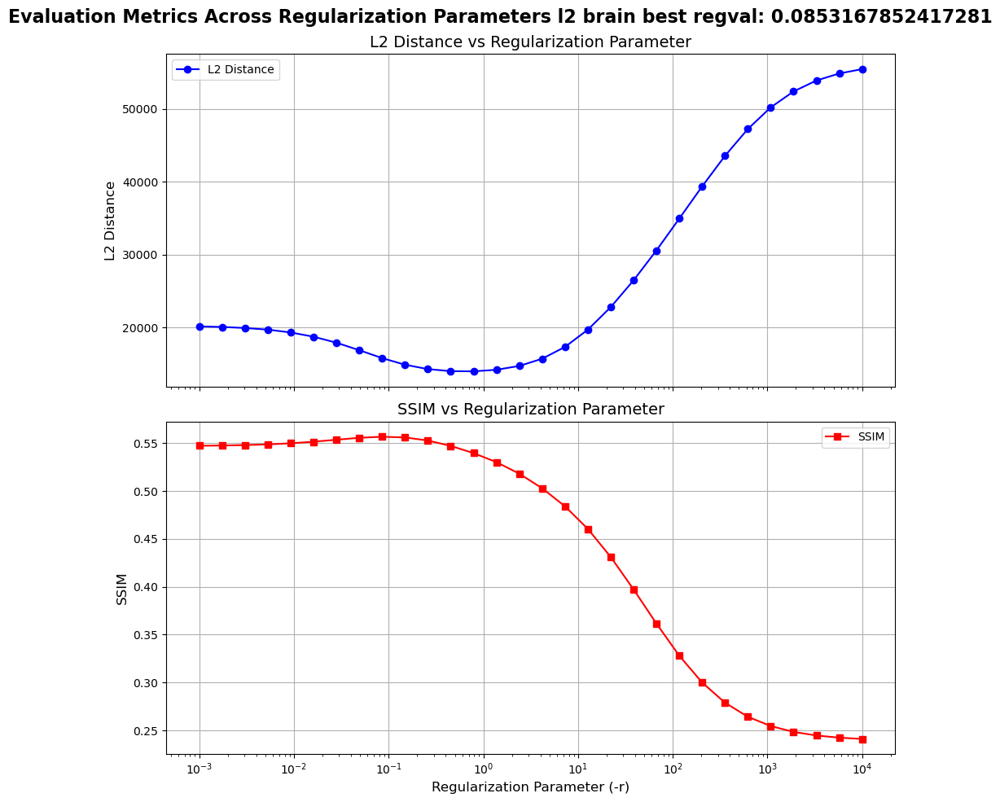

 the best regularization value seems to be: 0.0853167852417281


{'roi_parameters': {'center_x': 271,
  'center_y': 250,
  'major_axis': 202,
  'minor_axis': 220,
  'angle': 0},
 'regularization_values': [0.001,
  0.0017433288221999873,
  0.0030391953823131978,
  0.005298316906283708,
  0.009236708571873866,
  0.01610262027560939,
  0.02807216203941177,
  0.04893900918477494,
  0.0853167852417281,
  0.14873521072935117,
  0.2592943797404667,
  0.45203536563602453,
  0.7880462815669912,
  1.3738237958832638,
  2.395026619987486,
  4.175318936560405,
  7.278953843983154,
  12.689610031679234,
  22.122162910704503,
  38.56620421163472,
  67.23357536499334,
  117.21022975334817,
  204.33597178569437,
  356.2247890262444,
  621.0169418915616,
  1082.636733874054,
  1887.3918221350996,
  3290.344562312671,
  5736.152510448682,
  10000.0],
 'l2_distances': [20151.046875,
  20070.533203125,
  19927.6875,
  19702.763671875,
  19315.90234375,
  18732.818359375,
  17908.47265625,
  16879.61328125,
  15794.3916015625,
  14883.6796875,
  14283.60546875,
  13999.

In [8]:
prefix = 'brain'
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l2",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.001000
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 124.038072
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.001743
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 126.045614
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.003039
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 127.164280
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.005298
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 132.959336
[  1 512  30  30   1   1   1   1   1   1   1

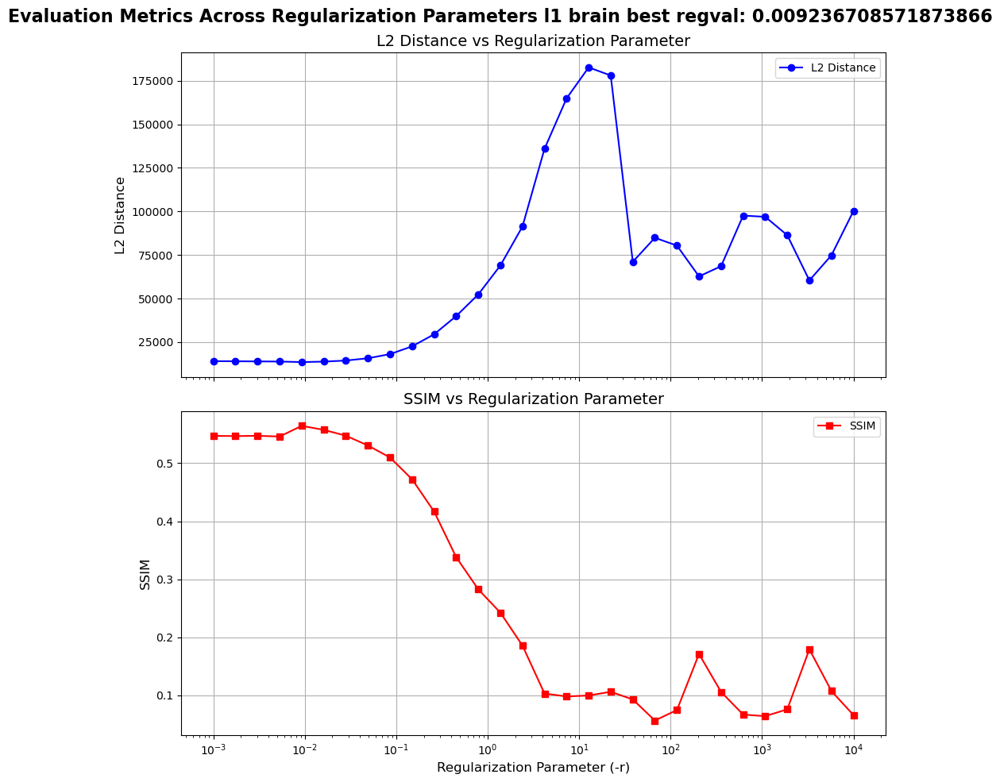

 the best regularization value seems to be: 0.009236708571873866


{'roi_parameters': {'center_x': 271,
  'center_y': 250,
  'major_axis': 202,
  'minor_axis': 220,
  'angle': 0},
 'regularization_values': [0.001,
  0.0017433288221999873,
  0.0030391953823131978,
  0.005298316906283708,
  0.009236708571873866,
  0.01610262027560939,
  0.02807216203941177,
  0.04893900918477494,
  0.0853167852417281,
  0.14873521072935117,
  0.2592943797404667,
  0.45203536563602453,
  0.7880462815669912,
  1.3738237958832638,
  2.395026619987486,
  4.175318936560405,
  7.278953843983154,
  12.689610031679234,
  22.122162910704503,
  38.56620421163472,
  67.23357536499334,
  117.21022975334817,
  204.33597178569437,
  356.2247890262444,
  621.0169418915616,
  1082.636733874054,
  1887.3918221350996,
  3290.344562312671,
  5736.152510448682,
  10000.0],
 'l2_distances': [14062.126953125,
  14000.87890625,
  13923.2822265625,
  13835.3349609375,
  13531.1943359375,
  13798.4873046875,
  14414.9404296875,
  15725.02734375,
  18090.53125,
  22547.14453125,
  29475.82226562

In [9]:
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l1",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000010
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.669637
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000017
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.328321
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000028
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 84.296130
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000047
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time

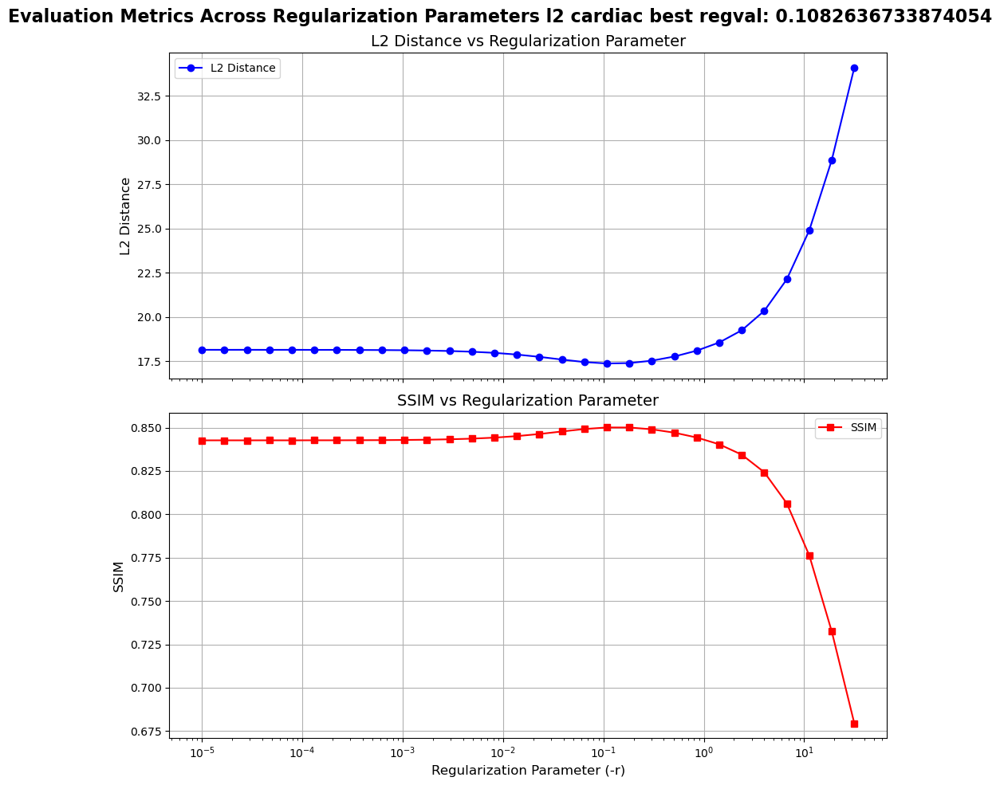

 the best regularization value seems to be: 0.1082636733874054


{'roi_parameters': {'center_x': 250,
  'center_y': 234,
  'major_axis': 107,
  'minor_axis': 95,
  'angle': 75},
 'regularization_values': [1e-05,
  1.6754749189233426e-05,
  2.8072162039411757e-05,
  4.703420341698635e-05,
  7.880462815669905e-05,
  0.00013203517797162948,
  0.000221221629107045,
  0.00037065129109221565,
  0.0006210169418915617,
  0.0010404983103657853,
  0.0017433288221999873,
  0.00292090371703225,
  0.004893900918477494,
  0.008199608244604943,
  0.013738237958832637,
  0.02301807313022468,
  0.03856620421163472,
  0.0646167078746697,
  0.1082636733874054,
  0.1813930693911063,
  0.3039195382313195,
  0.5092095636773397,
  0.8531678524172814,
  1.429461338356844,
  2.395026619987486,
  4.01280703194278,
  6.723357536499335,
  11.264816923358868,
  18.873918221350994,
  31.622776601683793],
 'l2_distances': [18.14182472229004,
  18.140483856201172,
  18.141864776611328,
  18.139232635498047,
  18.141448974609375,
  18.137178421020508,
  18.138273239135742,
  18.132

In [19]:
prefix = 'cardiac'
regvals = np.logspace(-5, 1.5, 30)
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l2",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000010
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 142.121134
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000017
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 142.146136
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000028
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 141.890039
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000047
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 142.215311
[  1 512  30  30   1   1   1   1   1   1   1

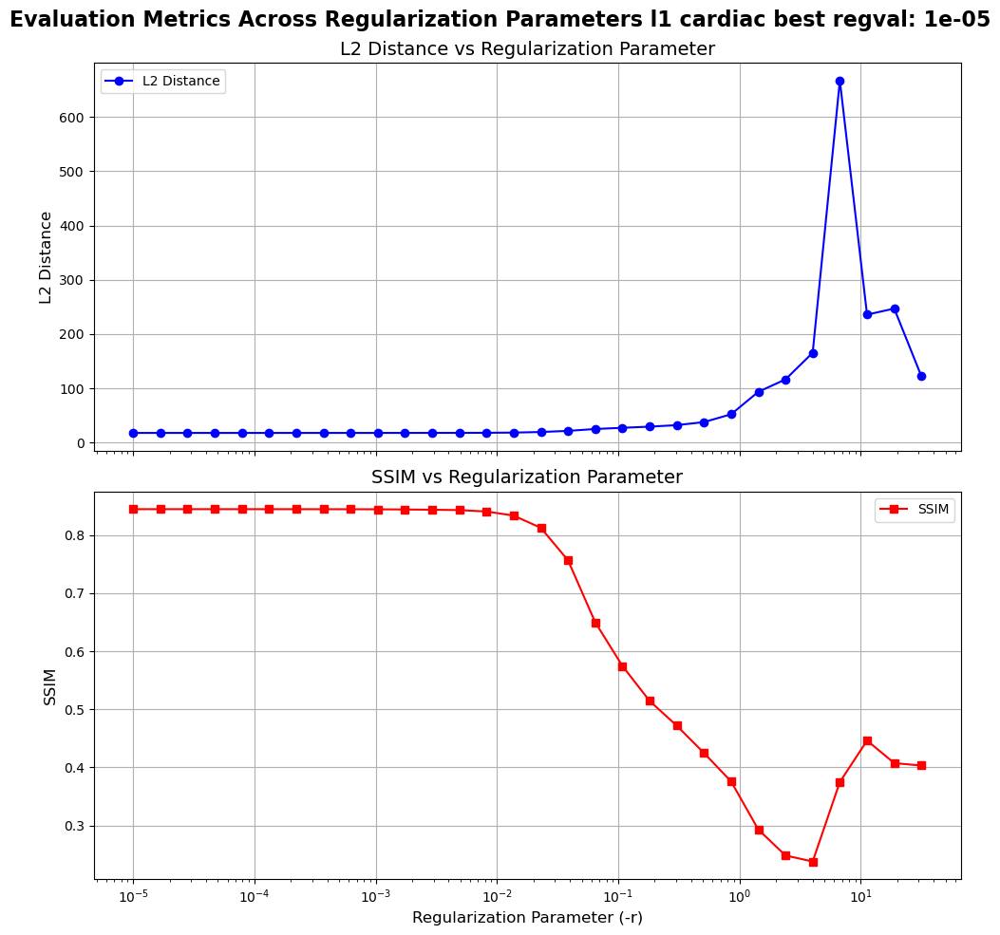

 the best regularization value seems to be: 1e-05


{'roi_parameters': {'center_x': 250,
  'center_y': 234,
  'major_axis': 107,
  'minor_axis': 95,
  'angle': 75},
 'regularization_values': [1e-05,
  1.6754749189233426e-05,
  2.8072162039411757e-05,
  4.703420341698635e-05,
  7.880462815669905e-05,
  0.00013203517797162948,
  0.000221221629107045,
  0.00037065129109221565,
  0.0006210169418915617,
  0.0010404983103657853,
  0.0017433288221999873,
  0.00292090371703225,
  0.004893900918477494,
  0.008199608244604943,
  0.013738237958832637,
  0.02301807313022468,
  0.03856620421163472,
  0.0646167078746697,
  0.1082636733874054,
  0.1813930693911063,
  0.3039195382313195,
  0.5092095636773397,
  0.8531678524172814,
  1.429461338356844,
  2.395026619987486,
  4.01280703194278,
  6.723357536499335,
  11.264816923358868,
  18.873918221350994,
  31.622776601683793],
 'l2_distances': [17.972557067871094,
  17.97262191772461,
  17.972732543945312,
  17.972923278808594,
  17.973247528076172,
  17.973806381225586,
  17.974788665771484,
  17.976

In [20]:
prefix = 'cardiac'
regvals = np.logspace(-5, 1.5, 30)
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l1",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001000
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.941842
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001743
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 84.335579
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.003039
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 84.362056
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.005298
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time

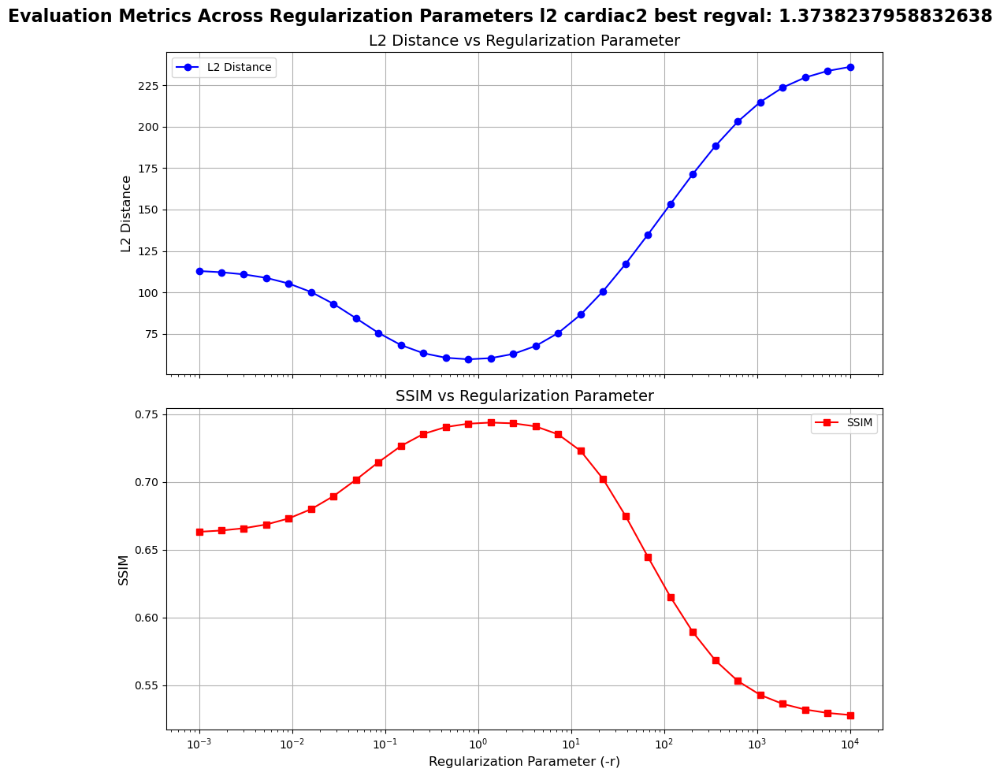

 the best regularization value seems to be: 1.3738237958832638


{'roi_parameters': {'center_x': 262,
  'center_y': 217,
  'major_axis': 100,
  'minor_axis': 132,
  'angle': 145},
 'regularization_values': [0.001,
  0.0017433288221999873,
  0.0030391953823131978,
  0.005298316906283708,
  0.009236708571873866,
  0.01610262027560939,
  0.02807216203941177,
  0.04893900918477494,
  0.0853167852417281,
  0.14873521072935117,
  0.2592943797404667,
  0.45203536563602453,
  0.7880462815669912,
  1.3738237958832638,
  2.395026619987486,
  4.175318936560405,
  7.278953843983154,
  12.689610031679234,
  22.122162910704503,
  38.56620421163472,
  67.23357536499334,
  117.21022975334817,
  204.33597178569437,
  356.2247890262444,
  621.0169418915616,
  1082.636733874054,
  1887.3918221350996,
  3290.344562312671,
  5736.152510448682,
  10000.0],
 'l2_distances': [112.92015838623047,
  112.17267608642578,
  110.89120483398438,
  108.7766342163086,
  105.37162780761719,
  100.21401977539062,
  93.05332946777344,
  84.37645721435547,
  75.54443359375,
  68.238761

In [4]:
prefix = 'cardiac2'
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l2",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000010
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 140.872993
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000017
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 141.331366
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000028
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 140.679140
[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000047
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 141.435572
[  1 512  30  30   1   1   1   1   1   1   1

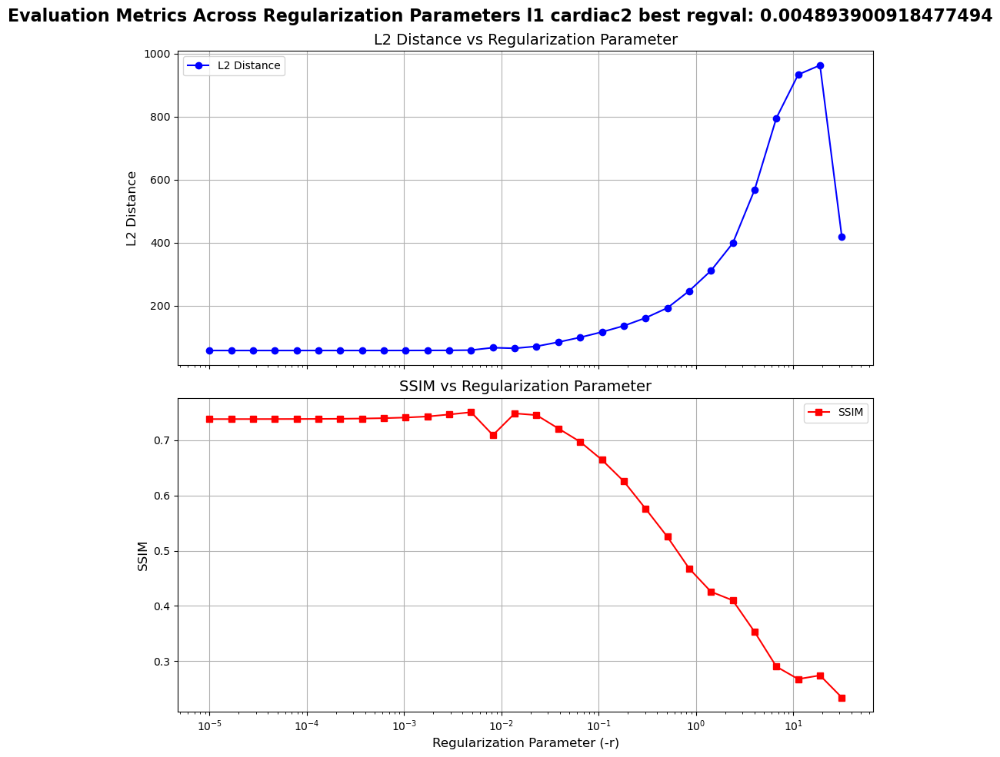

 the best regularization value seems to be: 0.004893900918477494


{'roi_parameters': {'center_x': 262,
  'center_y': 217,
  'major_axis': 100,
  'minor_axis': 132,
  'angle': 145},
 'regularization_values': [1e-05,
  1.6754749189233426e-05,
  2.8072162039411757e-05,
  4.703420341698635e-05,
  7.880462815669905e-05,
  0.00013203517797162948,
  0.000221221629107045,
  0.00037065129109221565,
  0.0006210169418915617,
  0.0010404983103657853,
  0.0017433288221999873,
  0.00292090371703225,
  0.004893900918477494,
  0.008199608244604943,
  0.013738237958832637,
  0.02301807313022468,
  0.03856620421163472,
  0.0646167078746697,
  0.1082636733874054,
  0.1813930693911063,
  0.3039195382313195,
  0.5092095636773397,
  0.8531678524172814,
  1.429461338356844,
  2.395026619987486,
  4.01280703194278,
  6.723357536499335,
  11.264816923358868,
  18.873918221350994,
  31.622776601683793],
 'l2_distances': [58.25850296020508,
  58.259098052978516,
  58.2601432800293,
  58.26194763183594,
  58.264957427978516,
  58.270172119140625,
  58.27056884765625,
  58.28693

In [22]:
prefix = 'cardiac2'
regvals = np.logspace(-5, 1.5, 30)
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l1",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000010
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 137.310912


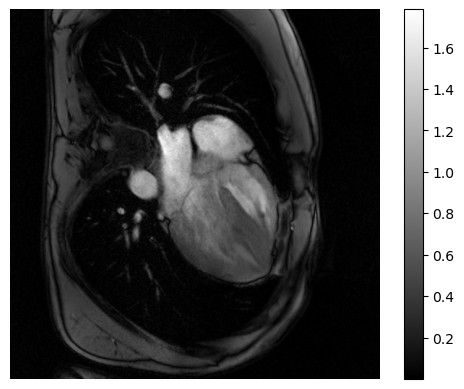

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000017
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 137.853100


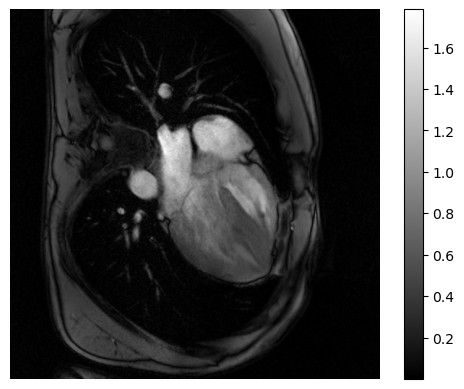

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000028
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 1107.030636


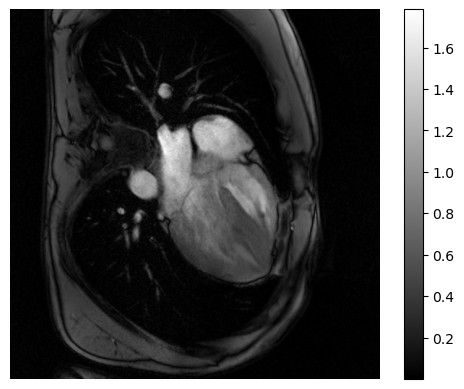

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000047
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 1854.374898


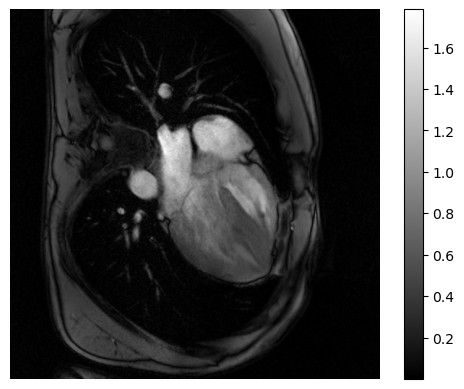

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000079
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 137.023246


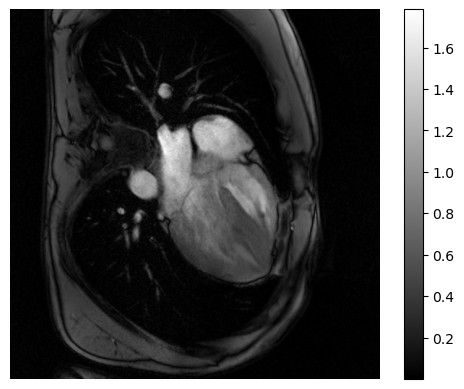

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000132
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 137.347810


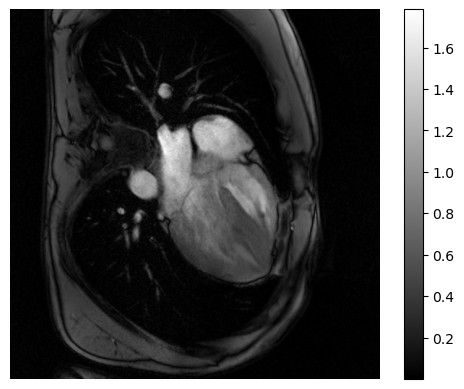

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000221
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 139.539455


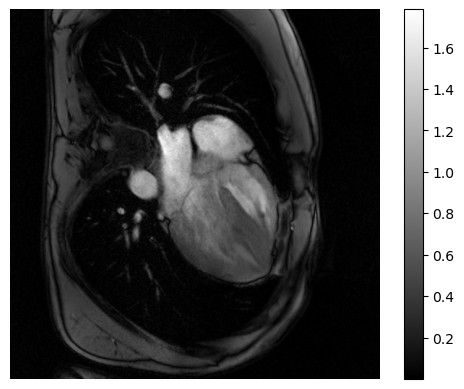

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000371
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 147.811183


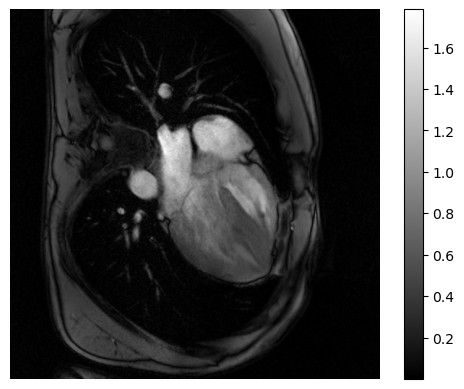

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000621
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 147.282603


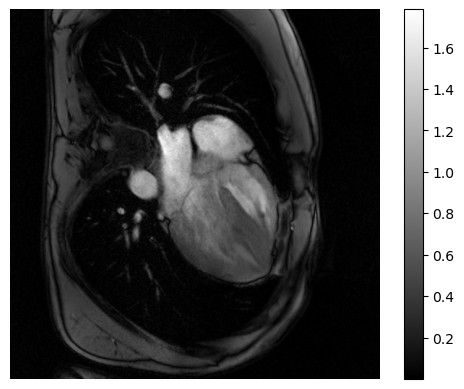

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.001040
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 148.313976


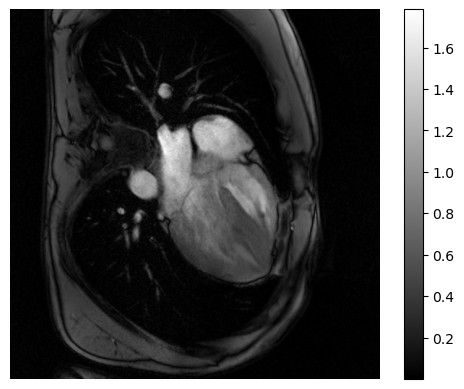

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.001743
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 147.991213


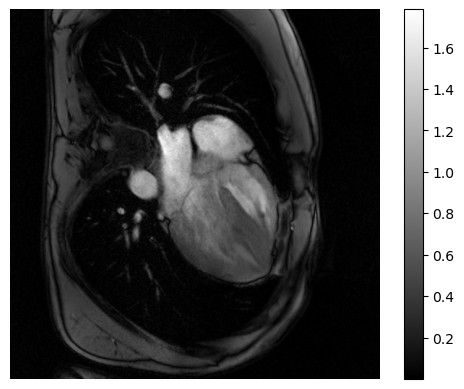

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.002921
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 148.196253


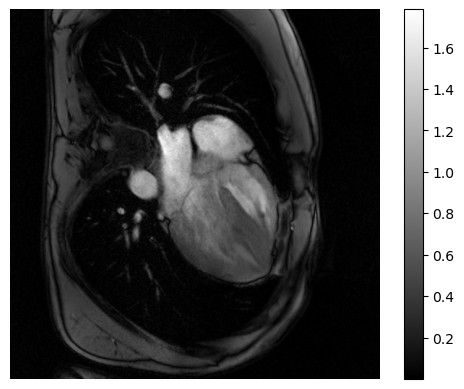

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.004894
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 145.586836


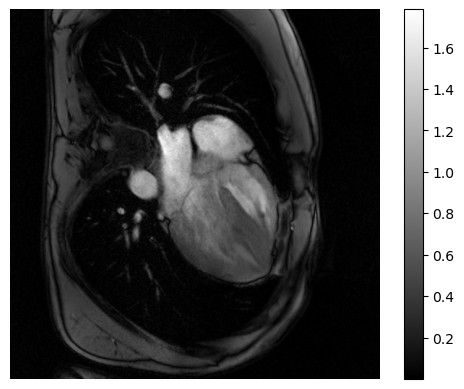

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.008200
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 126.402778


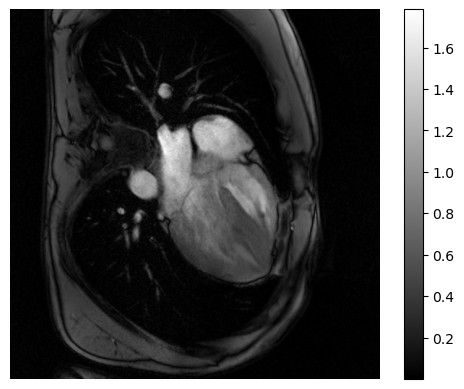

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.013738
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 133.273792


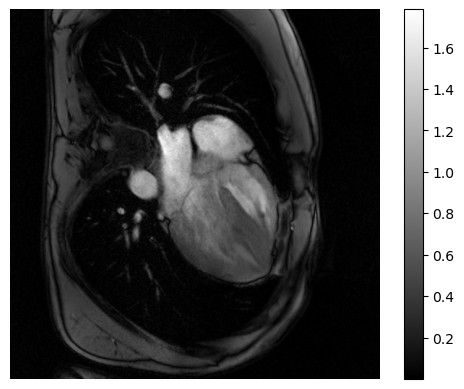

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.023018
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 117.766590


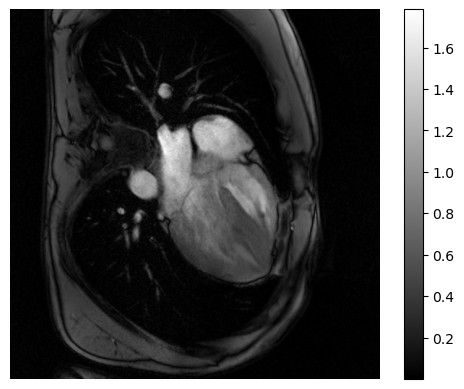

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.038566
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 97.847440


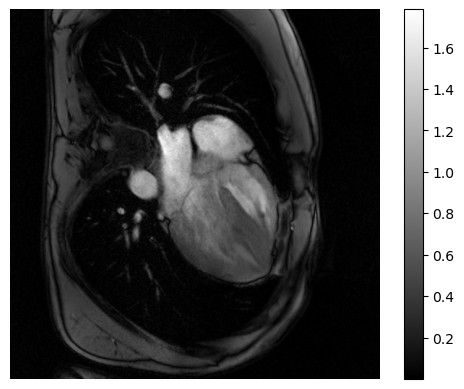

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.064617
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 101.574854


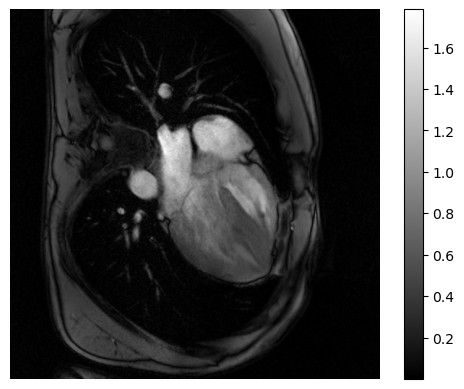

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.108264
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 98.538024


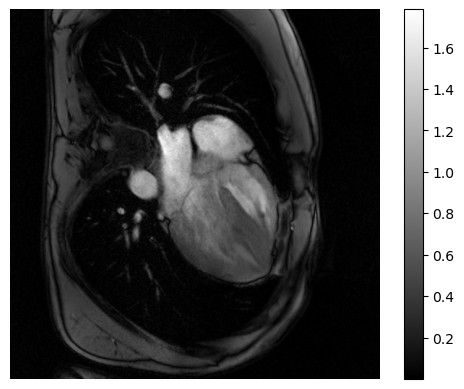

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.181393
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 99.436675


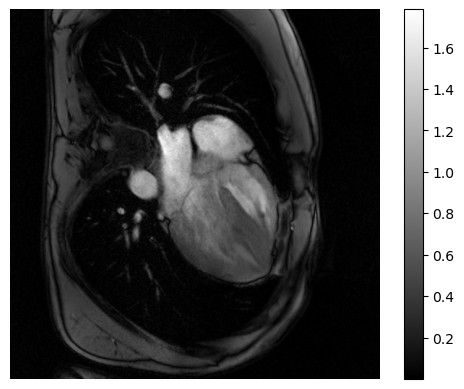

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.303920
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 98.821873


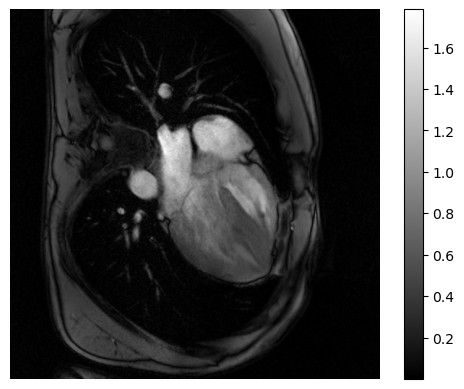

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.509210
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 97.430409


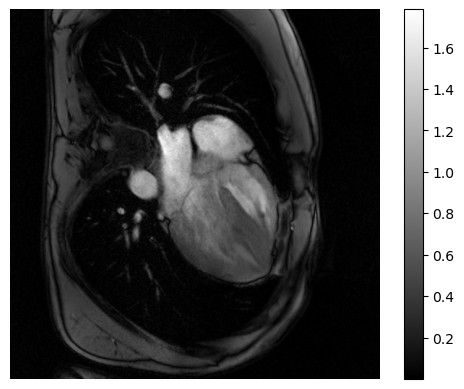

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.853168
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 99.763935


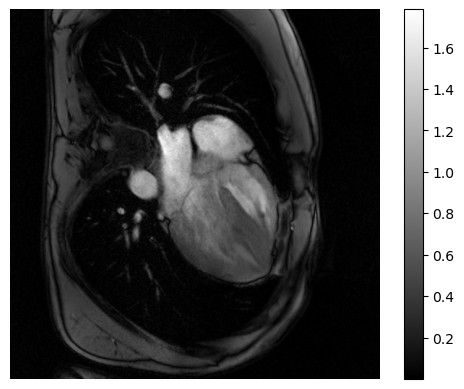

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 1.429461
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 96.690653


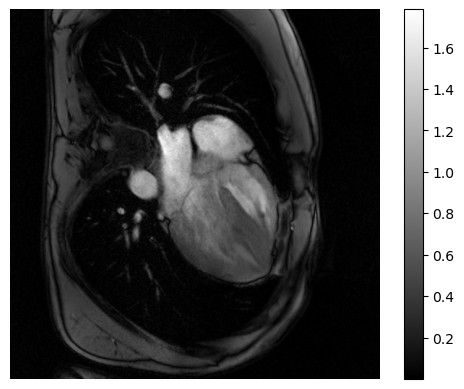

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 2.395027
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 94.954273


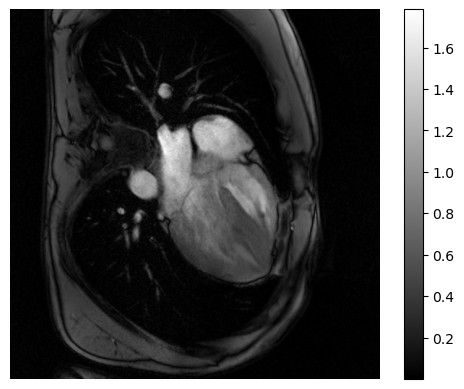

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 4.012807
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 96.036540


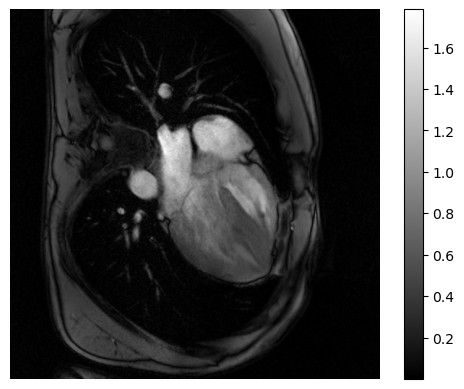

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 6.723358
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 98.664859


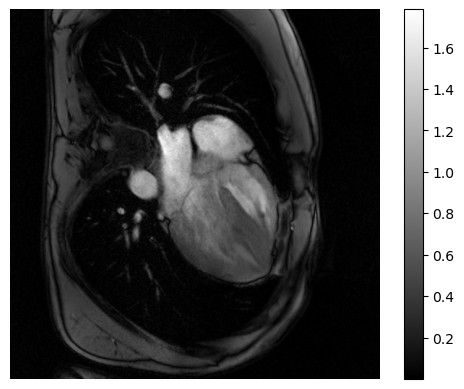

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 11.264817
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 102.368400


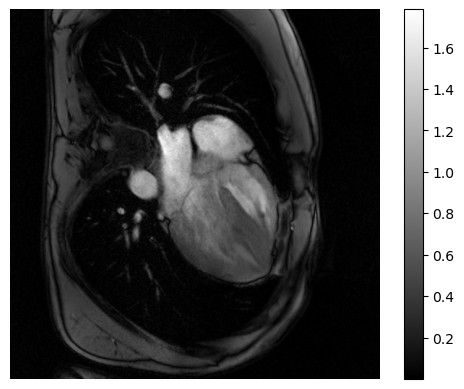

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 18.873919
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 98.980661


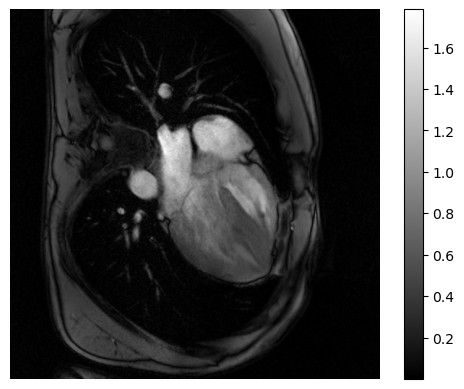

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 31.622776
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 101.749582


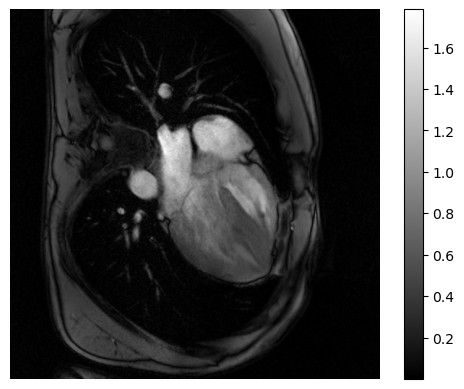

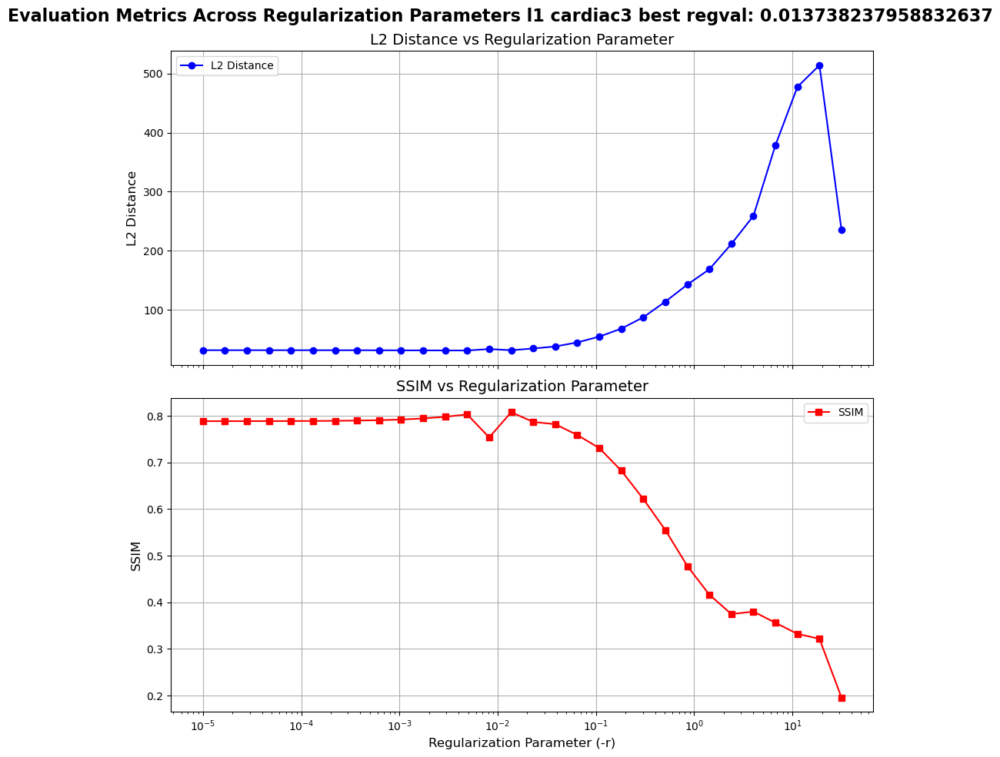

 the best regularization value seems to be: 0.013738237958832637


{'roi_parameters': {'center_x': 273,
  'center_y': 268,
  'major_axis': 128,
  'minor_axis': 128,
  'angle': 0},
 'regularization_values': [np.float64(1e-05),
  np.float64(1.6754749189233426e-05),
  np.float64(2.8072162039411757e-05),
  np.float64(4.703420341698635e-05),
  np.float64(7.880462815669905e-05),
  np.float64(0.00013203517797162948),
  np.float64(0.000221221629107045),
  np.float64(0.00037065129109221565),
  np.float64(0.0006210169418915617),
  np.float64(0.0010404983103657853),
  np.float64(0.0017433288221999873),
  np.float64(0.00292090371703225),
  np.float64(0.004893900918477494),
  np.float64(0.008199608244604943),
  np.float64(0.013738237958832637),
  np.float64(0.02301807313022468),
  np.float64(0.03856620421163472),
  np.float64(0.0646167078746697),
  np.float64(0.1082636733874054),
  np.float64(0.1813930693911063),
  np.float64(0.3039195382313195),
  np.float64(0.5092095636773397),
  np.float64(0.8531678524172814),
  np.float64(1.429461338356844),
  np.float64(2.395

In [3]:
prefix = 'cardiac3'
regvals = np.logspace(-5, 1.5, 30)
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l1",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000100
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 135.486527


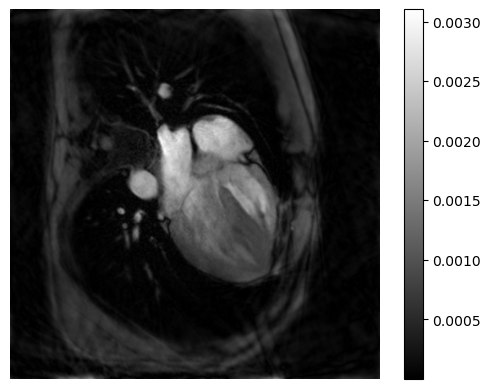

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.000501
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 140.054398


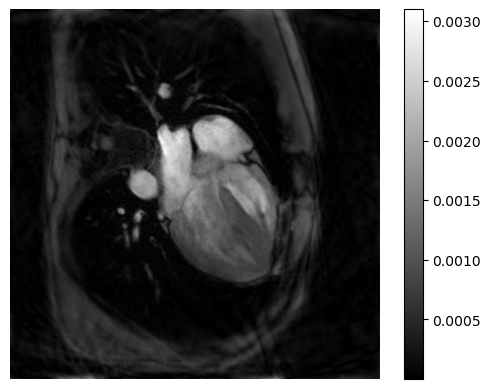

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.002512
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 143.568809


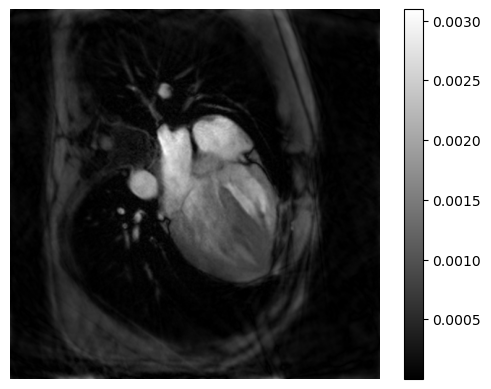

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.012589
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 127.821791


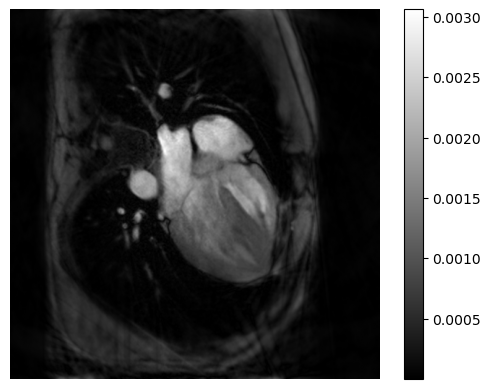

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.063096
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 97.298659


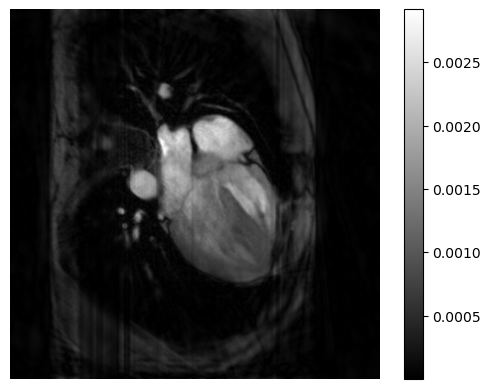

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l1 regularization: 0.316228
Regularization terms: 1, Supporting variables: 0
ADMM
Total Time: 97.432396


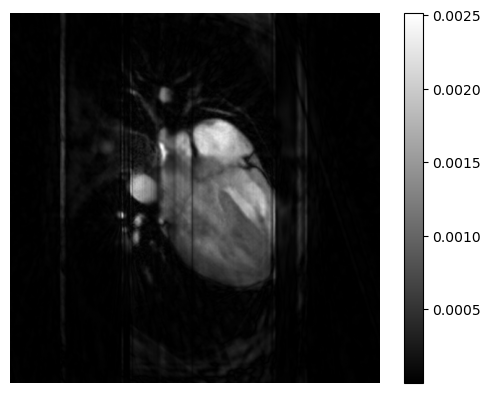

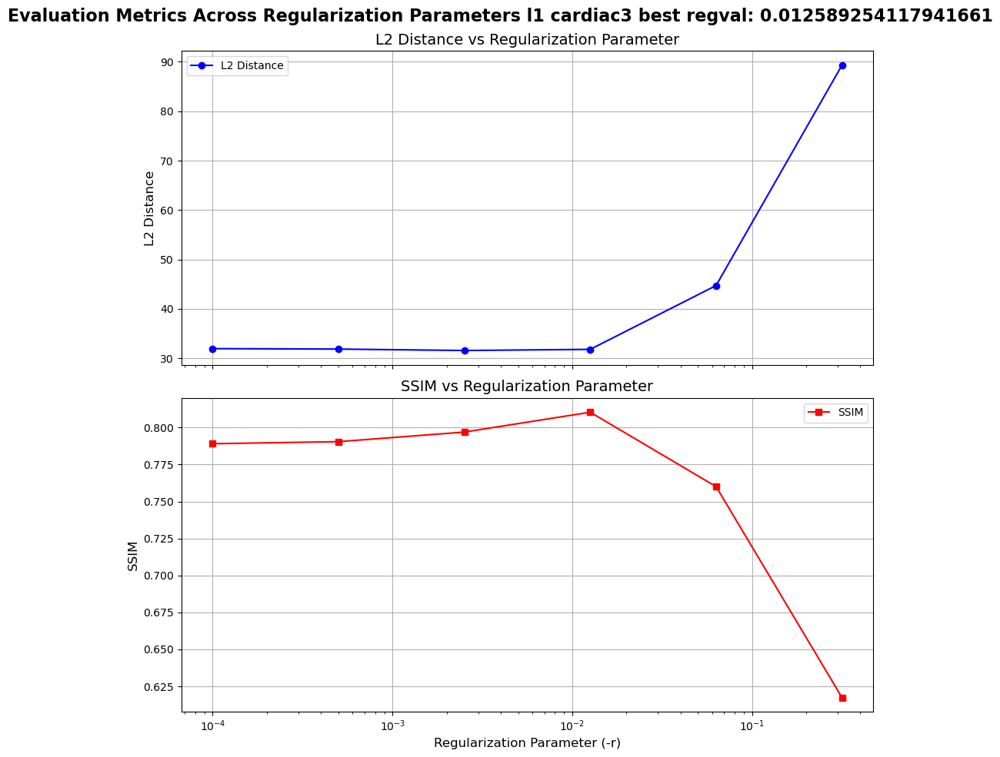

 the best regularization value seems to be: 0.012589254117941661


{'roi_parameters': {'center_x': 273,
  'center_y': 268,
  'major_axis': 128,
  'minor_axis': 128,
  'angle': 0},
 'regularization_values': [np.float64(0.0001),
  np.float64(0.0005011872336272725),
  np.float64(0.0025118864315095794),
  np.float64(0.012589254117941661),
  np.float64(0.0630957344480193),
  np.float64(0.31622776601683794)],
 'l2_distances': [31.95005226135254,
  31.860992431640625,
  31.570283889770508,
  31.80165672302246,
  44.7215690612793,
  89.31092834472656],
 'ssim_values': [0.7891122439862144,
  0.7904961362132186,
  0.7969916111338992,
  0.8104084298223773,
  0.7600891000952343,
  0.617445612161079],
 'bart_commands': ['./bart/bart pics -R I:1:0.0001 -i140 -m -u 0.001 -t ./bart_data/traj_bart -p ./bart_data/weights_bart_scaled ./bart_data/kspace_bartcardiac3 ./bart_data/C_bart l1reconweight',
  './bart/bart pics -R I:1:0.0005011872336272725 -i140 -m -u 0.0050118723362727255 -t ./bart_data/traj_bart -p ./bart_data/weights_bart_scaled ./bart_data/kspace_bartcardiac

In [2]:
prefix = 'cardiac3'
regvals = np.logspace(-4, -0.5, 6)
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l1",iterations = 140)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000010
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 81.930545


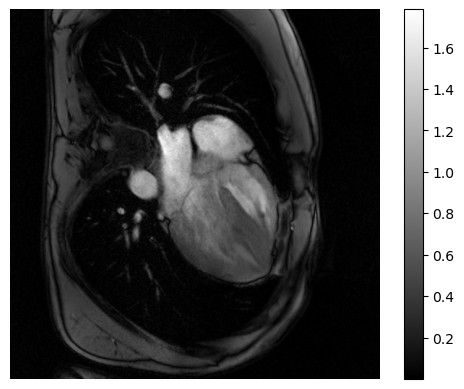

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000017
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.711018


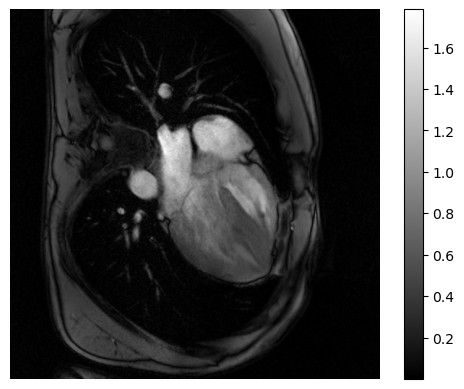

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000028
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.356922


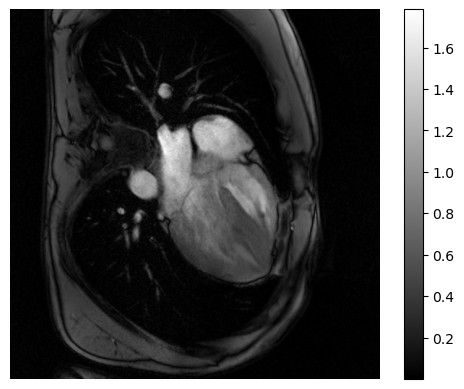

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000047
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.769759


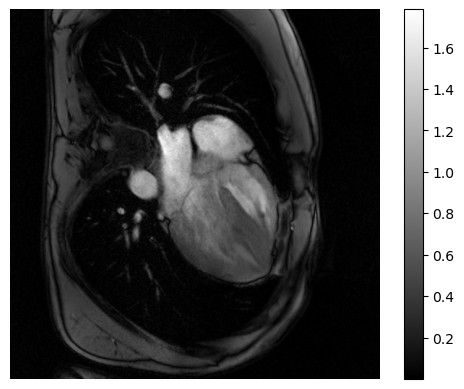

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000079
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.426011


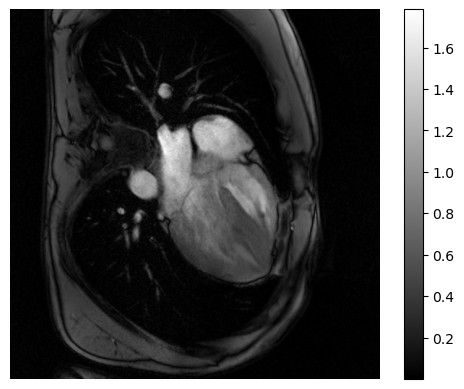

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000132
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.995783


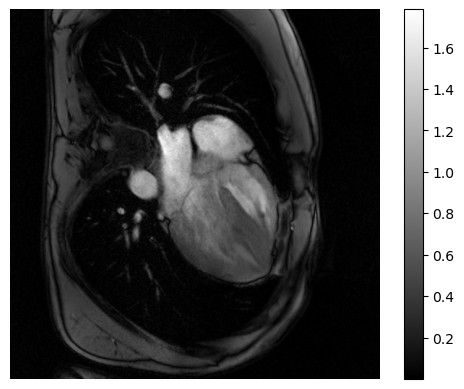

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000221
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.137706


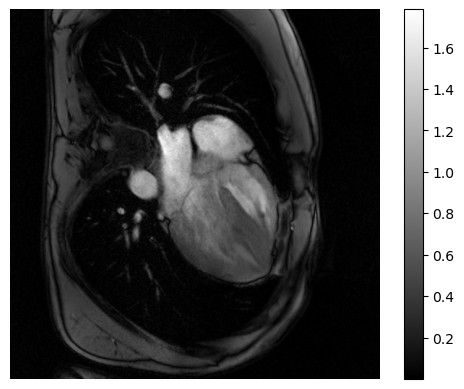

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000371
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.967269


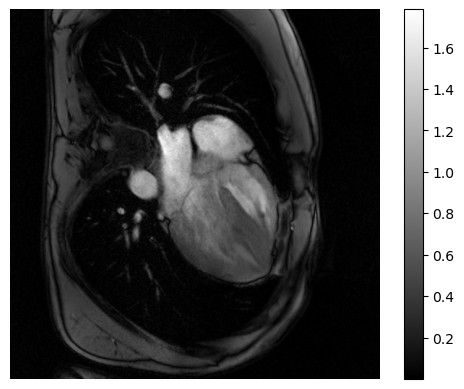

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.000621
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.130103


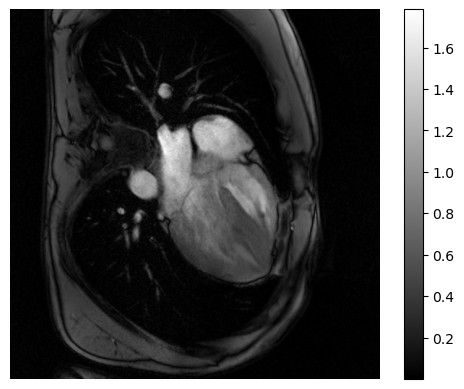

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001040
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.355978


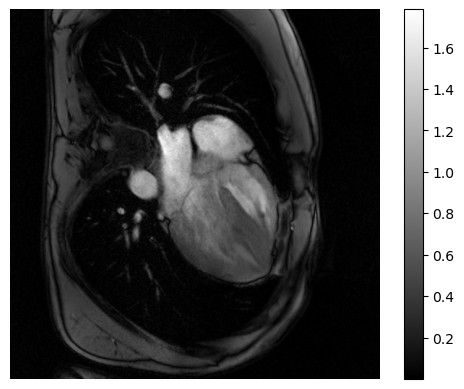

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.001743
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.219109


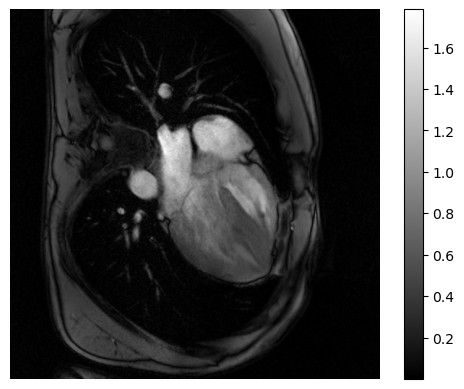

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.002921
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.128994


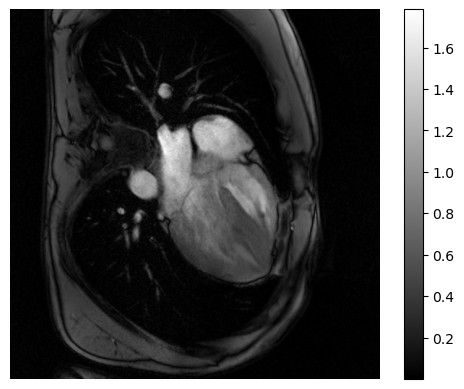

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.004894
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.494737


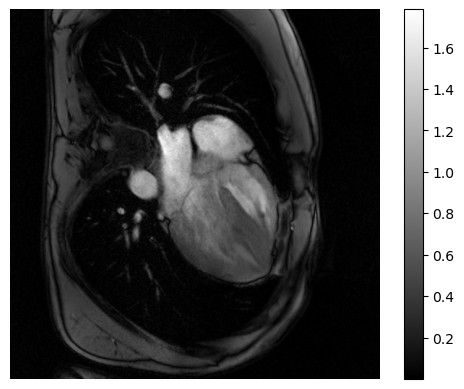

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.008200
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.125563


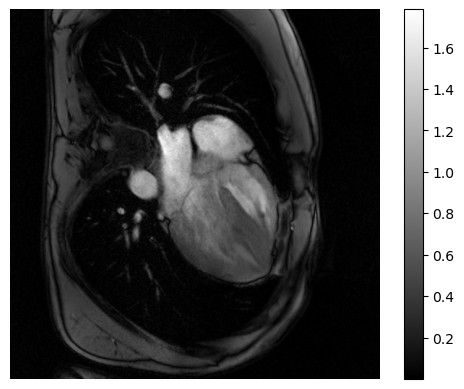

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.013738
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.364976


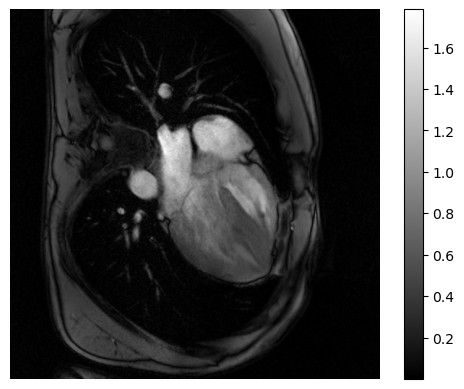

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.023018
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.023534


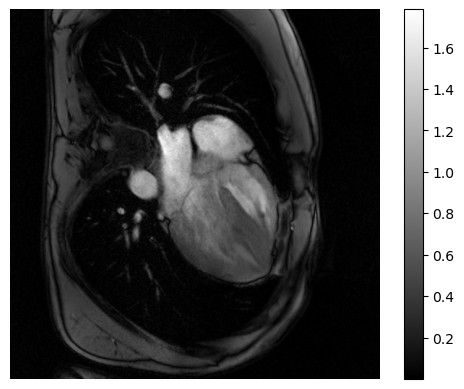

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.038566
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.850701


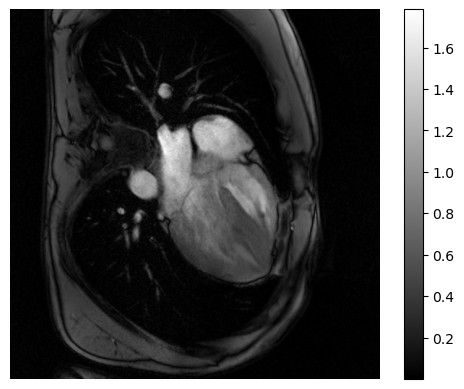

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.064617
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.841877


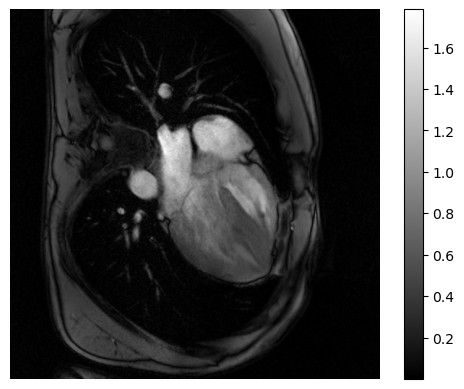

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.108264
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.914990


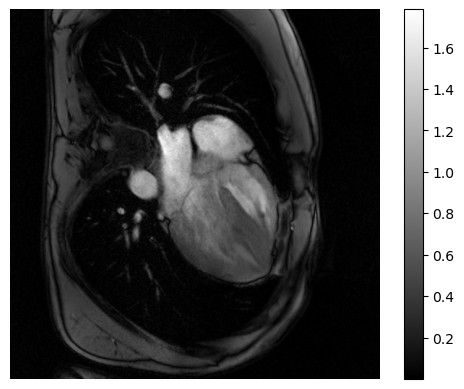

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.181393
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 84.026173


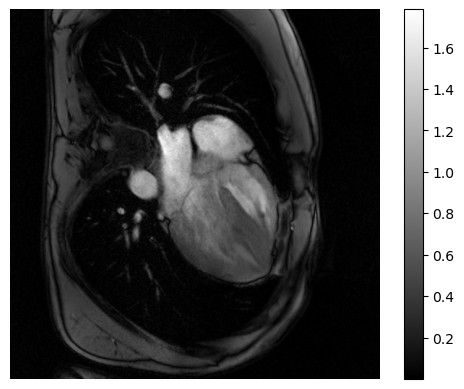

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.303920
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 82.918195


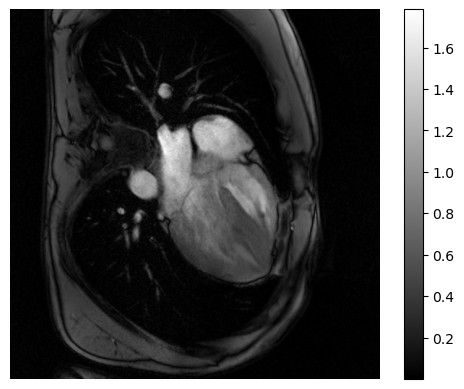

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.509210
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.229768


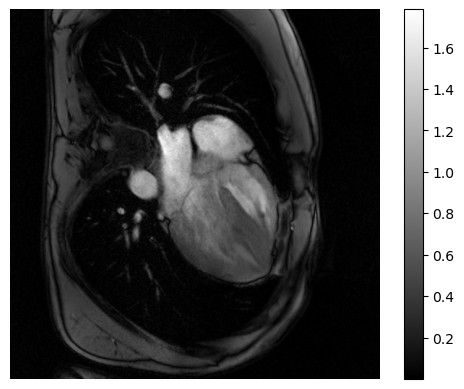

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 0.853168
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.330797


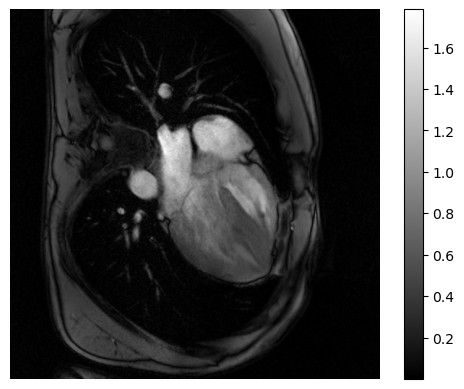

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 1.429461
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.072959


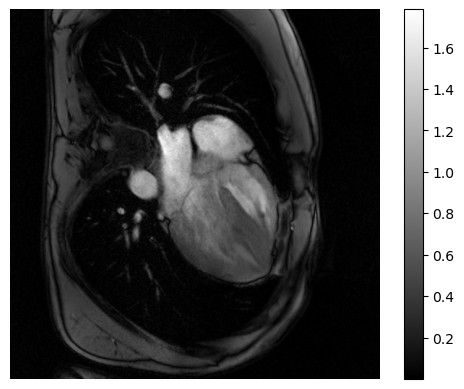

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 2.395027
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.111844


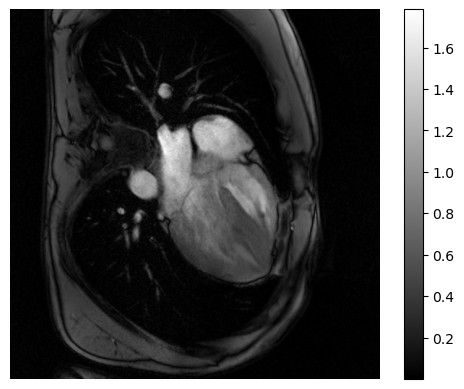

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 4.012807
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.350278


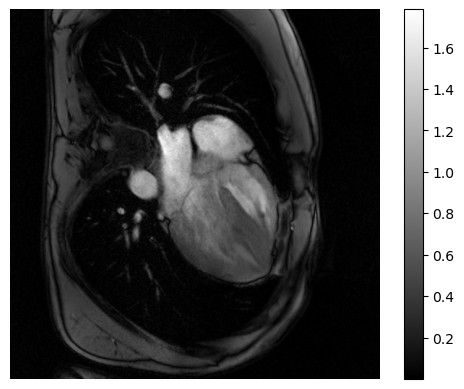

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 6.723358
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.769230


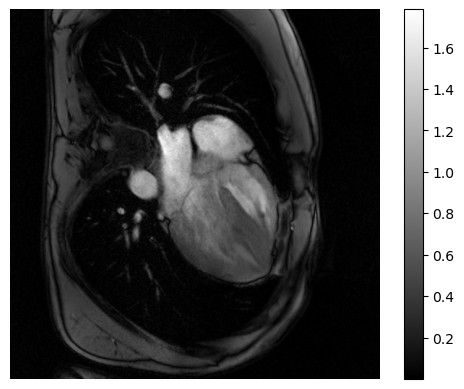

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 11.264817
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.737666


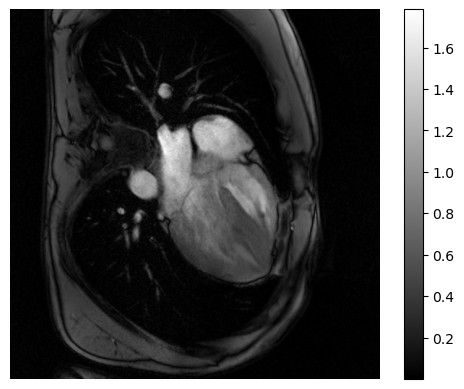

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 18.873919
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.169956


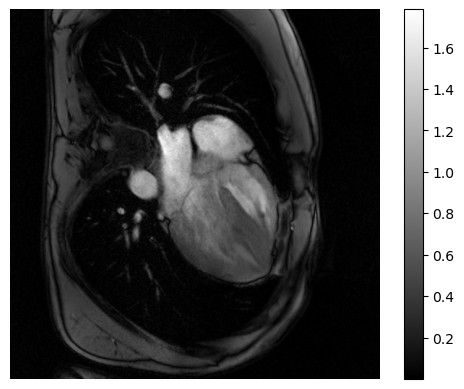

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 31.622776
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 83.690474


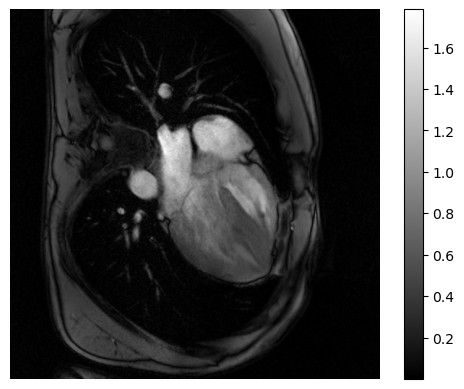

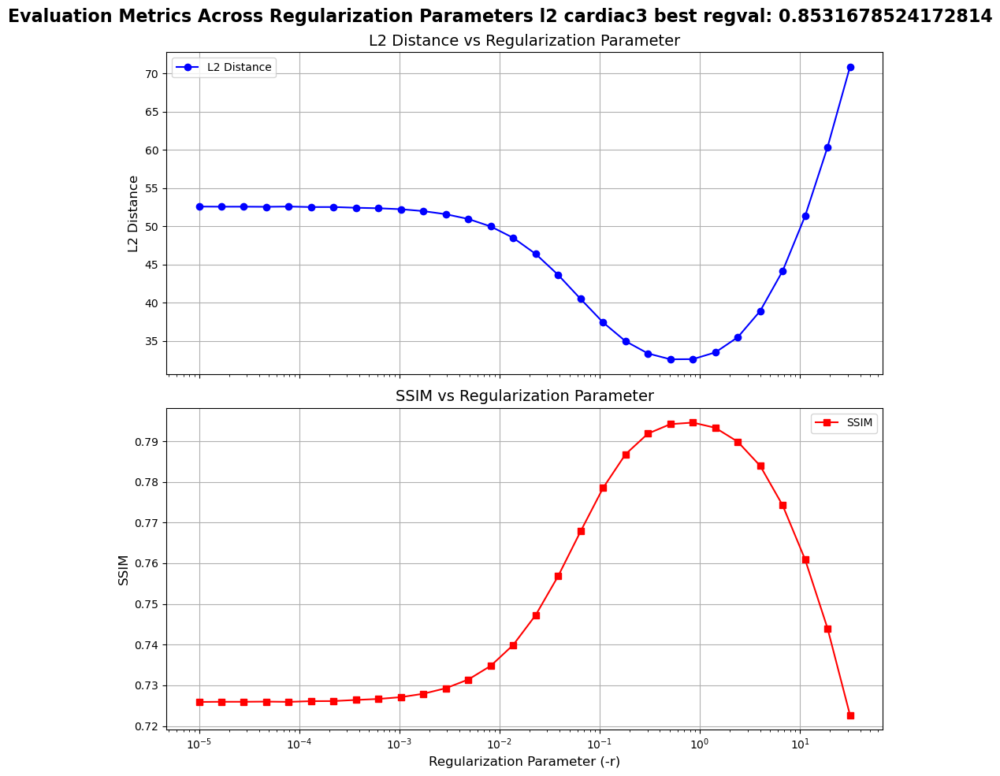

 the best regularization value seems to be: 0.8531678524172814


{'roi_parameters': {'center_x': 273,
  'center_y': 268,
  'major_axis': 128,
  'minor_axis': 128,
  'angle': 0},
 'regularization_values': [np.float64(1e-05),
  np.float64(1.6754749189233426e-05),
  np.float64(2.8072162039411757e-05),
  np.float64(4.703420341698635e-05),
  np.float64(7.880462815669905e-05),
  np.float64(0.00013203517797162948),
  np.float64(0.000221221629107045),
  np.float64(0.00037065129109221565),
  np.float64(0.0006210169418915617),
  np.float64(0.0010404983103657853),
  np.float64(0.0017433288221999873),
  np.float64(0.00292090371703225),
  np.float64(0.004893900918477494),
  np.float64(0.008199608244604943),
  np.float64(0.013738237958832637),
  np.float64(0.02301807313022468),
  np.float64(0.03856620421163472),
  np.float64(0.0646167078746697),
  np.float64(0.1082636733874054),
  np.float64(0.1813930693911063),
  np.float64(0.3039195382313195),
  np.float64(0.5092095636773397),
  np.float64(0.8531678524172814),
  np.float64(1.429461338356844),
  np.float64(2.395

In [4]:
prefix = 'cardiac3'
regvals = np.logspace(-5, 1.5, 30)
evaluate_bart_reconstruction_with_roi(regvals, prefix, regtype="l2",iterations = 140)

In [12]:
prefix = 'phantom'
# Load the ground truth image: need to adjust the naming convention
groundtruth = cfl.readcfl(f'./bart_data/final{prefix}image')

In [13]:
groundtruth

array([[0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       ...,
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j]],
      dtype=complex64)

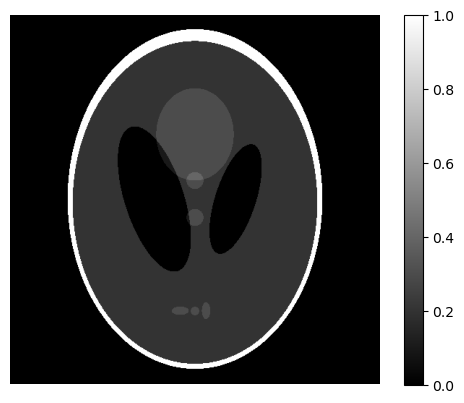

In [14]:
# Display the image
plt.imshow(abs(groundtruth), cmap="gray")  # Use grayscale colormap
plt.colorbar()  # Optional: Show color scale
plt.axis("off")  # Hide axes
plt.show()

In [17]:
bart_command = f"./bart/bart pics -r1.3 -l2 -i100 -t ./bart_data/traj_bart -p ./bart_data/weights_bart_scaled ./bart_data/kspace_bartphantom ./bart_data/C_bart l2reconweight"
subprocess.run(bart_command, shell=True)

[  1 512  30  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
[512 512   1  30   1   1   1   1   1   1   1   1   1   1   1   1 ]
l2 regularization: 1.300000
Regularization terms: 1, Supporting variables: 0
conjugate gradients
Total Time: 60.456916


CompletedProcess(args='./bart/bart pics -r1.3 -l2 -i100 -t ./bart_data/traj_bart -p ./bart_data/weights_bart_scaled ./bart_data/kspace_bartphantom ./bart_data/C_bart l2reconweight', returncode=0)

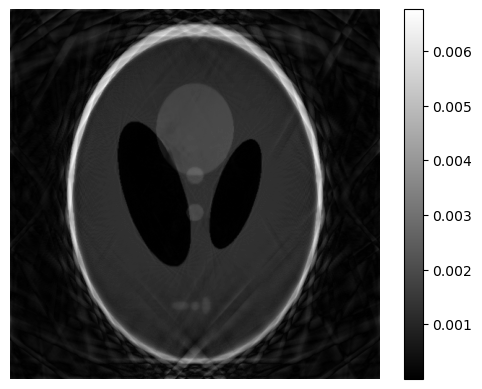

In [18]:
recon = cfl.readcfl(f'./l2reconweight');
# Display the image
plt.imshow(abs(recon), cmap="gray")  # Use grayscale colormap
plt.colorbar()  # Optional: Show color scale
plt.axis("off")  # Hide axes
plt.show()